In [1]:
import numpy as np

import matplotlib.pyplot as plt
import mplhep as hep

from scipy.stats import wasserstein_distance

plt.style.use(hep.cms.style.ROOT)
plt.rcParams['axes.axisbelow'] = True

In [2]:
model_name = 'nominal'
modelDir = '/net/scratch_cms3a/hschoenen/deepjet/results/{}'.format(model_name)
saveDir = '/net/scratch_cms3a/hschoenen/deepjet/plots'

def get_array(quantity,attack='nominal'):
    array = np.load('{}/variables/{}/{}.npy'.format(modelDir,attack,quantity))
    return array

isB = get_array('isB')
isBB = get_array('isBB')
isLeptonicB = get_array('isLeptonicB')
isC = get_array('isC')
isUDS = get_array('isUDS')
isG = get_array('isG')

flavours = [isB,isBB,isLeptonicB,isC,isUDS,isG]
flavour_names = ['isB','isBB','isLeptonicB','isC','isUDS','isG']
sum = 0
for i in range(len(flavours)):
    print('{}: {:n}'.format(flavour_names[i], np.sum(flavours[i])))
    sum += np.sum(flavours[i])
print('total: {:n}'.format(sum))

B = isB + isBB + isLeptonicB
C = isC
L = isUDS + isG

isB: 28340
isBB: 211
isLeptonicB: 4418
isC: 19899
isUDS: 47762
isG: 28369
total: 128999


In [3]:
# calculate Kullack-Leibler divergence
def kldiv(A, B):
        return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])

# calculate Jensen-Shannon divergence
def jsdiv(P, Q, normalize_first=False):
    P = np.array(P)
    Q = np.array(Q)
    if normalize_first:
        P = P/P.sum()
        Q = Q/Q.sum()
    M = 0.5 * (P + Q)
    return 0.5 * (kldiv(P, M) +kldiv(Q, M))

attack_labels = {
    'nominal': 'nominal',
    'fgsm-0_01': r'fgsm $\epsilon=0.01$',
    'fgsm-0_05': r'fgsm $\epsilon=0.05$',
    'fgsm-0_1': r'fgsm $\epsilon=0.1$',
}
attack_colors = {
    'nominal': 'tab:blue',
    'fgsm-0_01': 'tab:orange',
    'fgsm-0_05': 'tab:orange',
    'fgsm-0_1': 'tab:red',
    
}
    
quantity_labels = {
    # global
    'jet_pt': '$p_{T}[GeV]$', 
    'jet_eta': '$\eta$',
    'nCpfcand': '$N_{CPF}$',
    'nNpfcand': '$N_{NPF}$',
    'nsv': '$N_{SV}$',
    'npv': '$N_{PV}$',
    'TagVarCSV_trackSumJetEtRatio': 'TagVarCSV_trackSumJetEtRatio',
    'TagVarCSV_trackSumJetDeltaR': 'TagVarCSV_trackSumJetDeltaR',
    'TagVarCSV_vertexCategory': 'TagVarCSV_vertexCategory',
    'TagVarCSV_trackSip2dValAboveCharm': 'TagVarCSV_trackSip2dValAboveCharm',
    'TagVarCSV_trackSip2dSigAboveCharm': 'TagVarCSV_trackSip2dSigAboveCharm',
    'TagVarCSV_trackSip3dValAboveCharm': 'TagVarCSV_trackSip3dValAboveCharm',
    'TagVarCSV_trackSip3dSigAboveCharm': 'TagVarCSV_trackSip3dSigAboveCharm',
    'TagVarCSV_jetNSelectedTracks': 'TagVarCSV_jetNSelectedTracks',
    'TagVarCSV_jetNTracksEtaRel': 'TagVarCSV_jetNTracksEtaRel',
    # cpf
    'Cpfcan_BtagPf_trackEtaRel': 'Cpfcan_BtagPf_trackEtaRel',
    'Cpfcan_BtagPf_trackPtRel': 'Cpfcan_BtagPf_trackPtRel',
    'Cpfcan_BtagPf_trackPPar': 'Cpfcan_BtagPf_trackPPar',
    'Cpfcan_BtagPf_trackDeltaR': 'Cpfcan_BtagPf_trackDeltaR',
    'Cpfcan_BtagPf_trackPParRatio': 'Cpfcan_BtagPf_trackPParRatio',
    'Cpfcan_BtagPf_trackSip2dVal': 'Cpfcan_BtagPf_trackSip2dVal',
    'Cpfcan_BtagPf_trackSip2dSig': 'Cpfcan_BtagPf_trackSip2dSig',
    'Cpfcan_BtagPf_trackSip3dVal': 'Cpfcan_BtagPf_trackSip3dVal',
    'Cpfcan_BtagPf_trackSip3dSig': 'Cpfcan_BtagPf_trackSip3dSig',
    'Cpfcan_BtagPf_trackJetDistVal': 'Cpfcan_BtagPf_trackJetDistVal',
    'Cpfcan_ptrel': 'Cpfcan_ptrel',
    'Cpfcan_drminsv': 'Cpfcan_drminsv',
    'Cpfcan_VTX_ass': 'Cpfcan_VTX_ass',
    'Cpfcan_puppiw': 'Cpfcan_puppiw',
    'Cpfcan_chi2': 'Cpfcan_chi2',
    'Cpfcan_quality': 'Cpfcan_quality',
    # npf
    'Npfcan_ptrel': 'Npfcan_ptrel', 
    'Npfcan_deltaR': 'Npfcan_deltaR',
    'Npfcan_isGamma': 'Npfcan_isGamma', 
    'Npfcan_HadFrac': 'Npfcan_HadFrac', 
    'Npfcan_drminsv': 'Npfcan_drminsv', 
    'Npfcan_puppiw': 'Npfcan_puppiw',
    # vtx
    'sv_pt': 'sv_pt',
    'sv_deltaR': 'sv_deltaR',
    'sv_mass': 'sv_mass',
    'sv_ntracks': 'sv_ntracks',
    'sv_chi2': 'sv_chi2',
    'sv_normchi2': 'sv_normchi2',
    'sv_dxy': 'sv_dxy',
    'sv_dxysig': 'sv_dxysig',
    'sv_d3d': 'sv_d3d',
    'sv_d3dsig': 'sv_d3dsig',
    'sv_costhetasvpv': 'sv_costhetasvpv',
    'sv_enratio': 'sv_enratio',
    # labels
    'isB': 0,
    'isBB': 0, 
    'isLeptonicB': 0, 
    'isC': 0, 
    'isUDS': 0, 
    'isG': 0,
    # outputs
    'prob_isB': 'P(b)',
    'prob_isBB': 'P(bb)', 
    'prob_isLeptonicB': 'P(lep b)', 
    'prob_isC': 'P(c)', 
    'prob_isUDS': 'P(uds)',
    'prob_isG': 'P(g)',
}

sv_pt: minimum 0 , maximum 1499.22
    -999: 0 , -1: 0 , 0:67590
sv_deltaR: minimum -0.5 , maximum 0
    -999: 0 , -1: 0 , 0:67590
sv_mass: minimum 0 , maximum 80.4225
    -999: 0 , -1: 0 , 0:67590
sv_ntracks: minimum 0 , maximum 20
    -999: 0 , -1: 0 , 0:67590
sv_chi2: minimum 0 , maximum 39.751
    -999: 0 , -1: 0 , 0:67590
sv_normchi2: minimum -1000 , maximum 1000
    -999: 0 , -1: 0 , 0:67590
sv_dxy: minimum 0 , maximum 44.5366
    -999: 0 , -1: 0 , 0:67590
sv_dxysig: minimum 0 , maximum 800
    -999: 0 , -1: 0 , 0:67590
sv_d3d: minimum 0 , maximum 109.871
    -999: 0 , -1: 0 , 0:67590
sv_d3dsig: minimum 0 , maximum 800
    -999: 0 , -1: 0 , 0:67590
sv_costhetasvpv: minimum -1 , maximum 1
    -999: 0 , -1: 1 , 0:67590
sv_enratio: minimum 0 , maximum 16.3624
    -999: 0 , -1: 0 , 0:67590


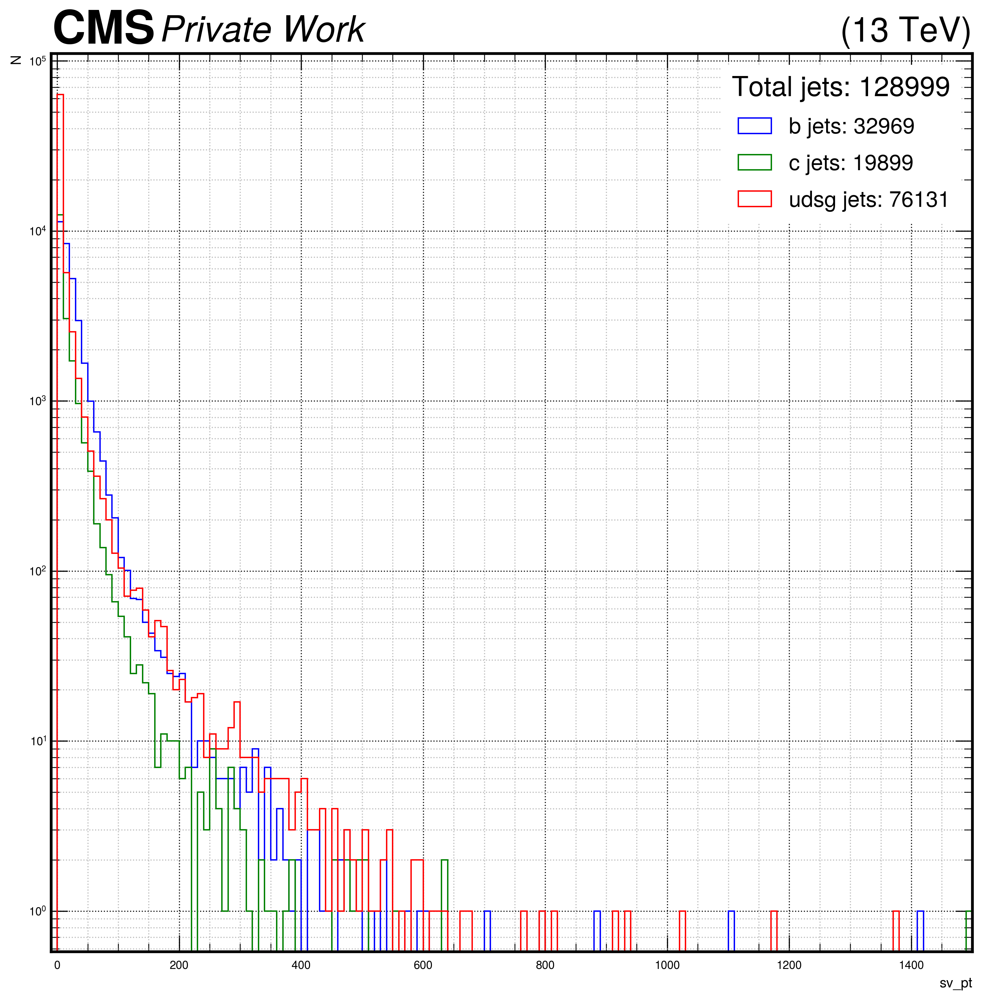

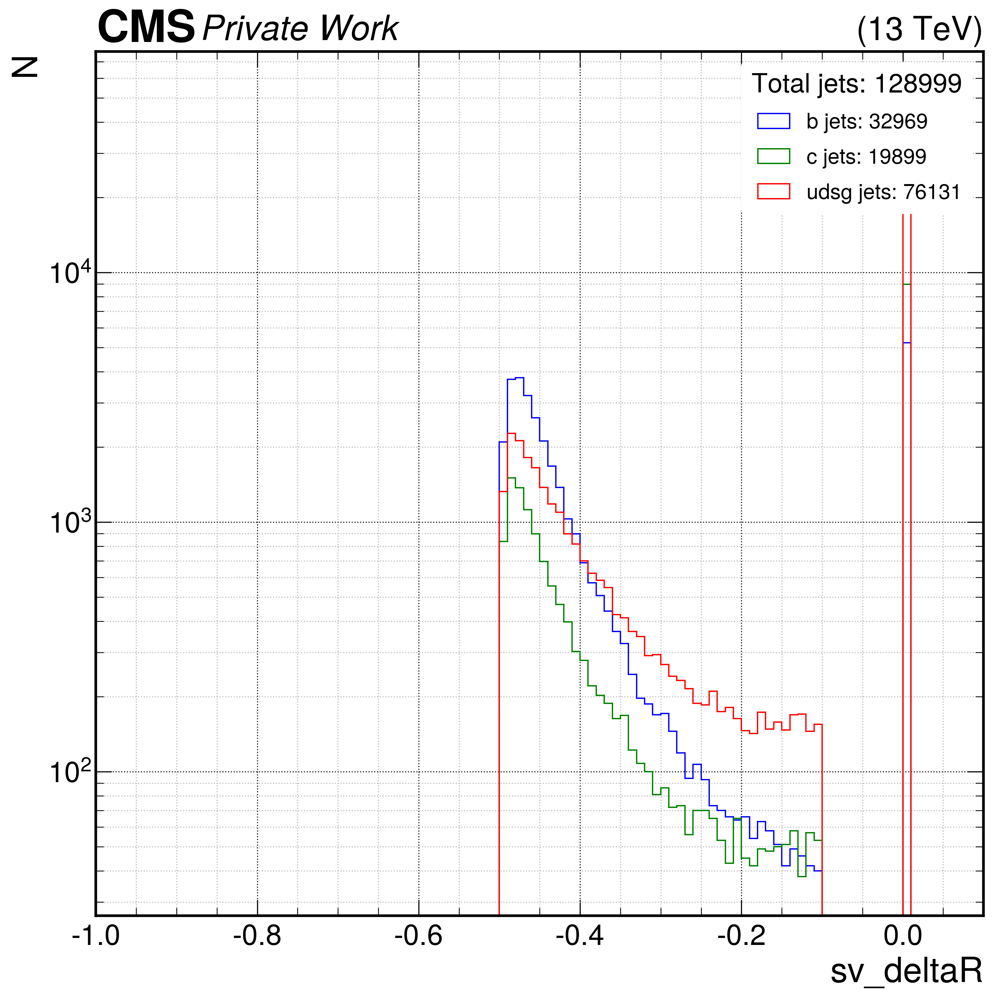

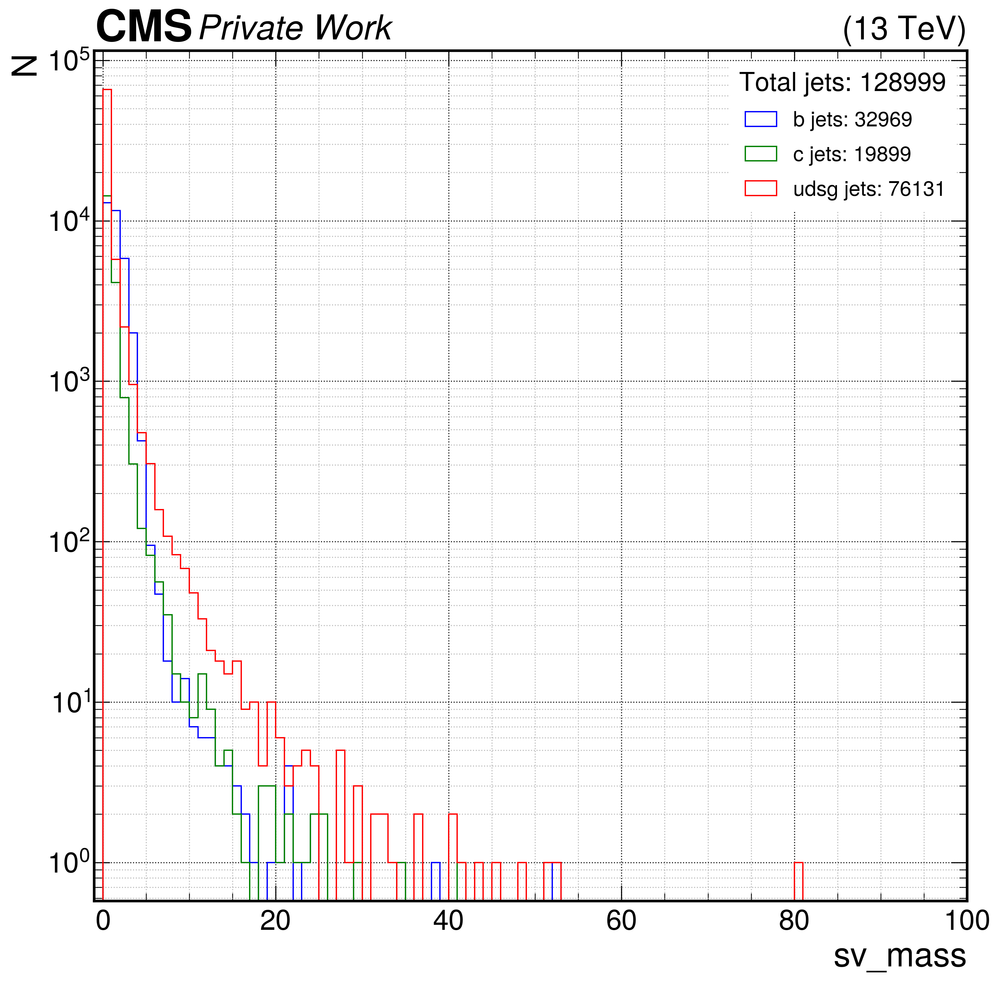

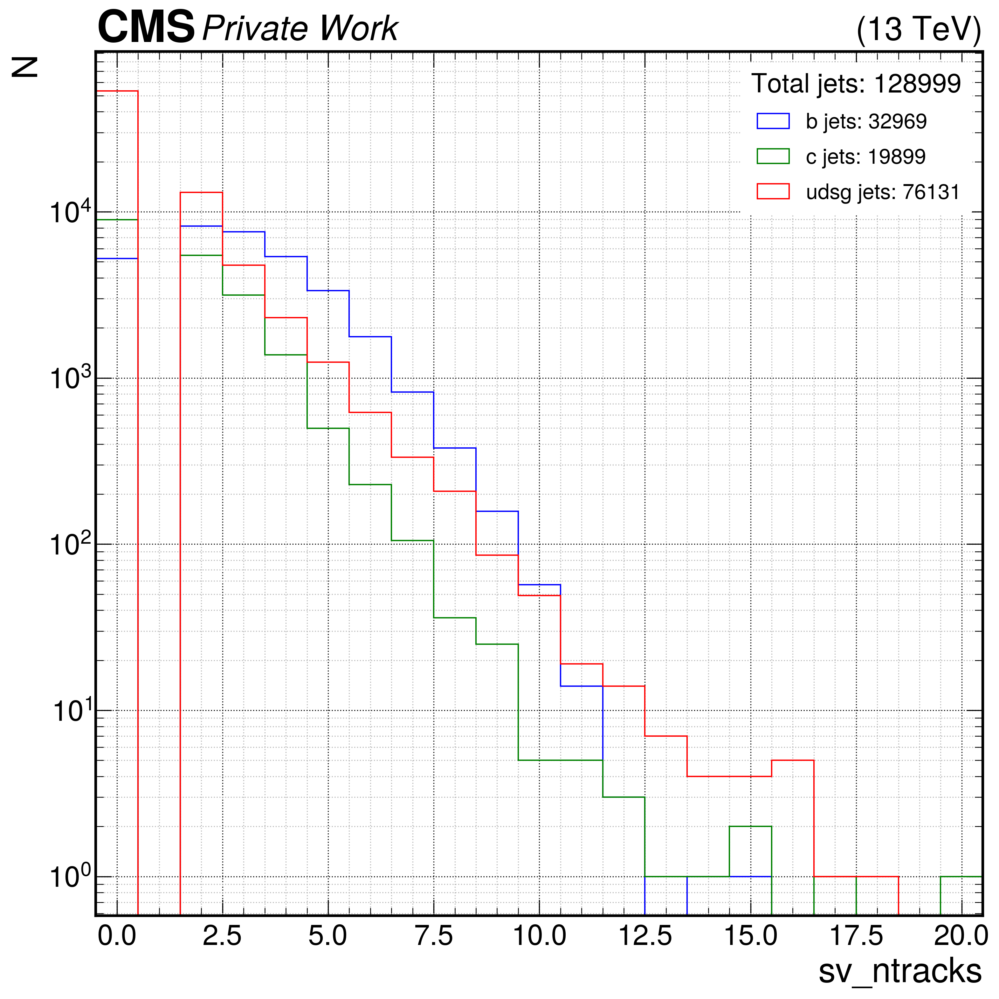

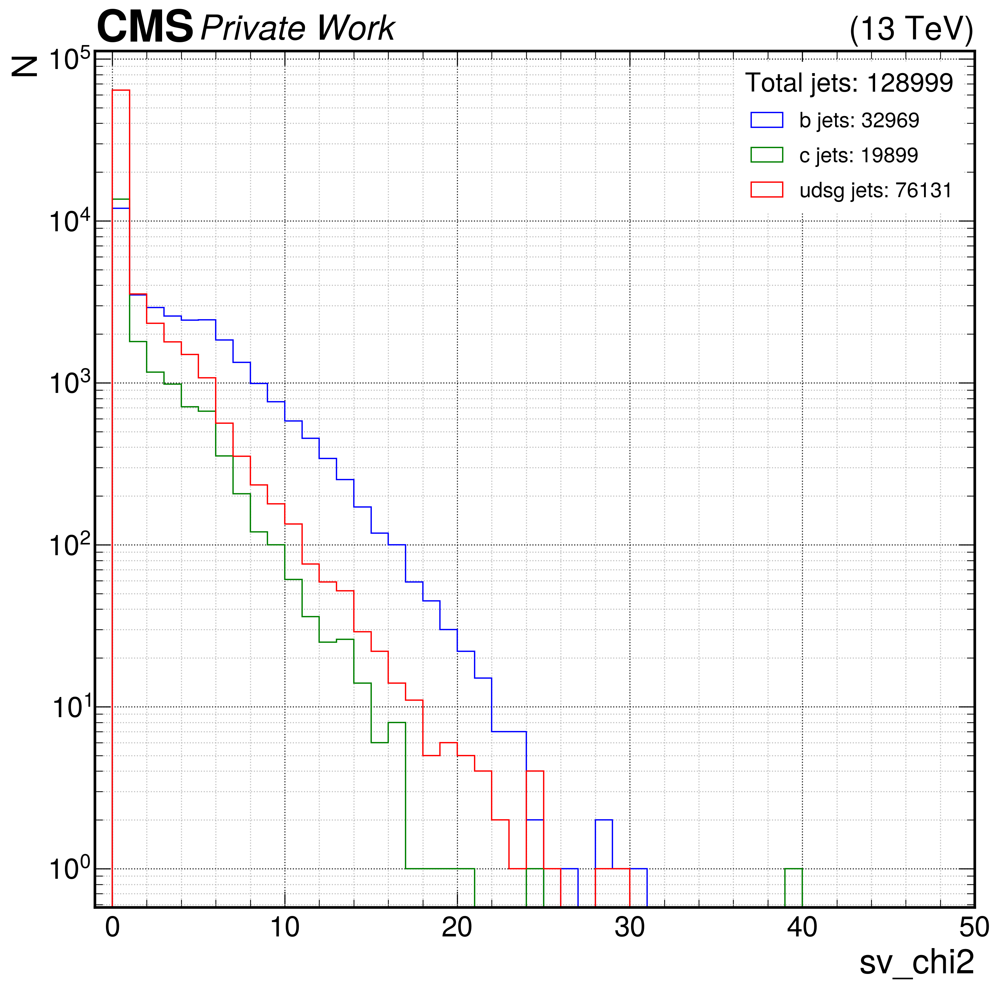

...

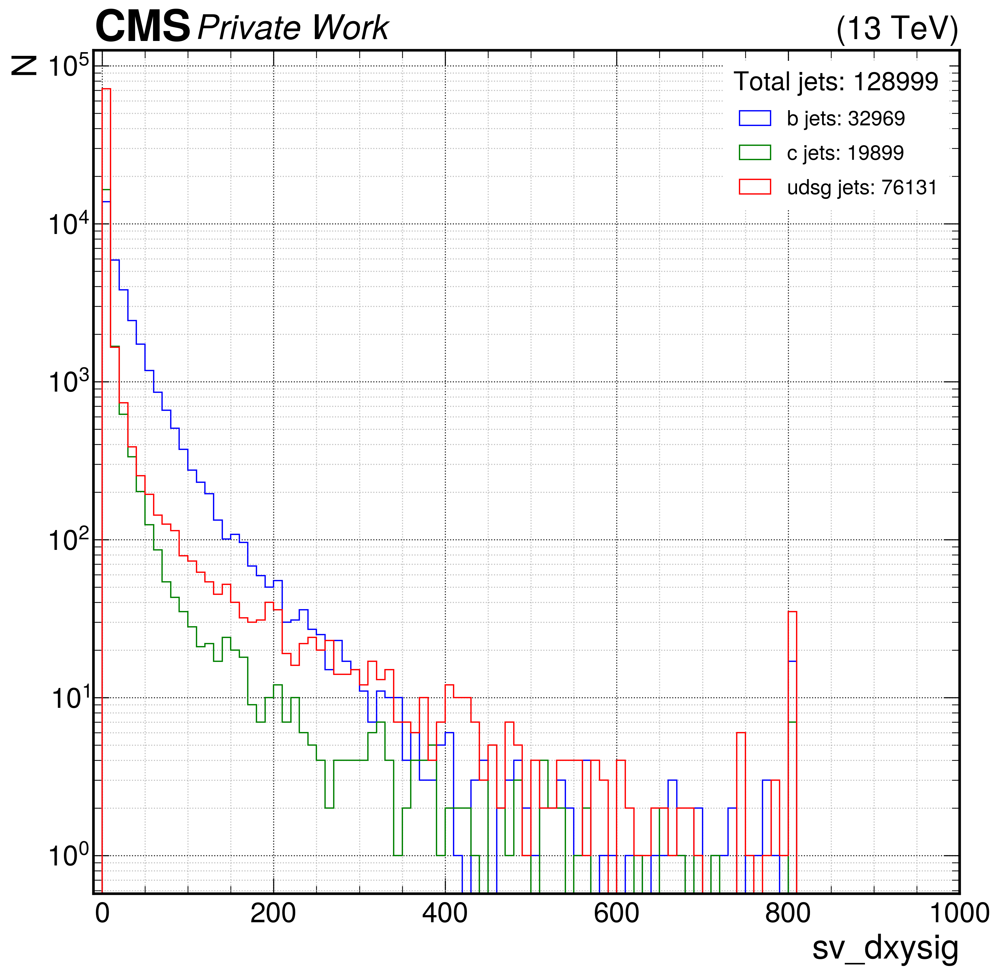

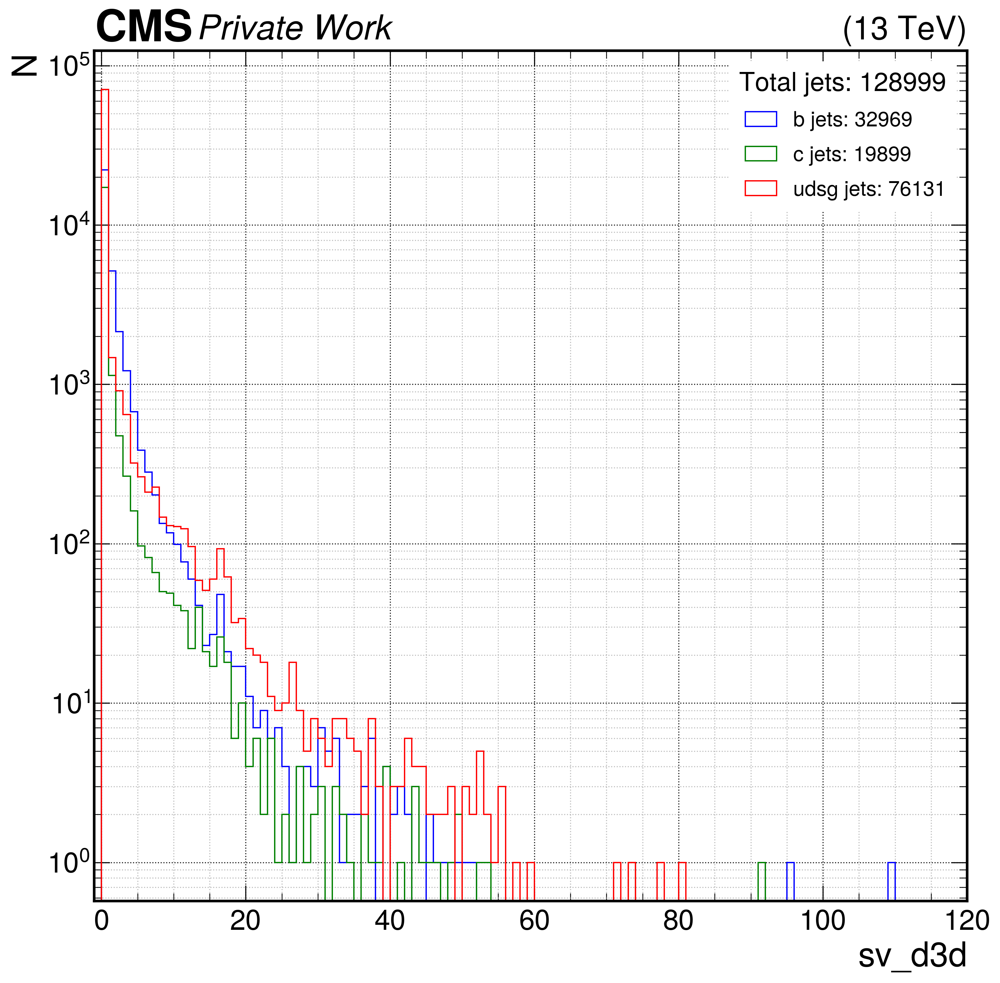

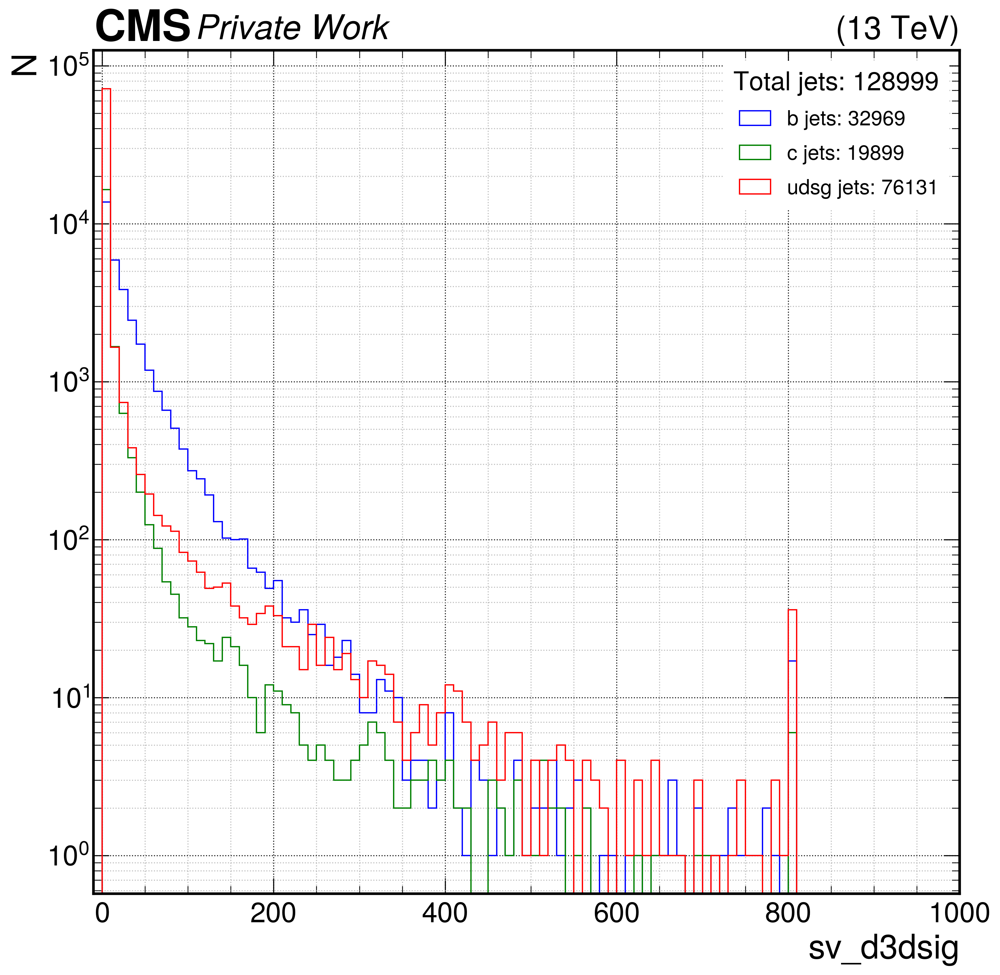

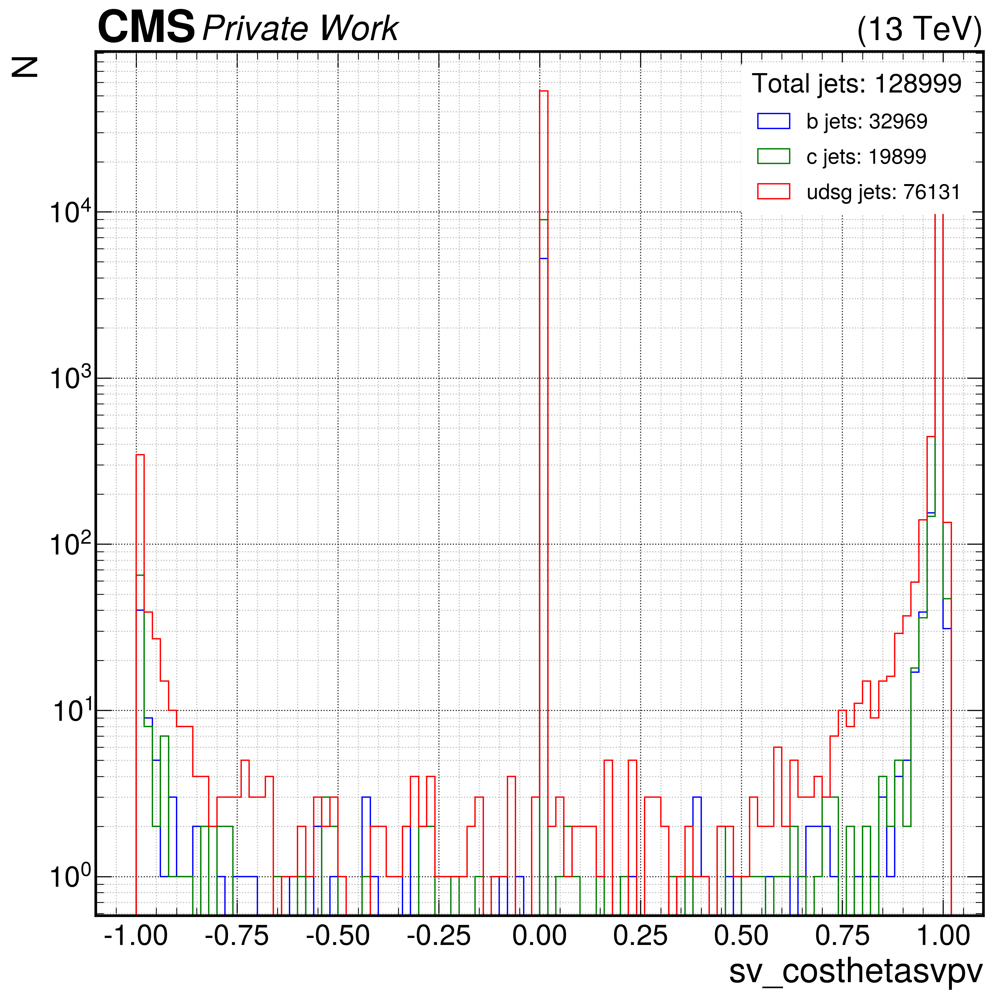

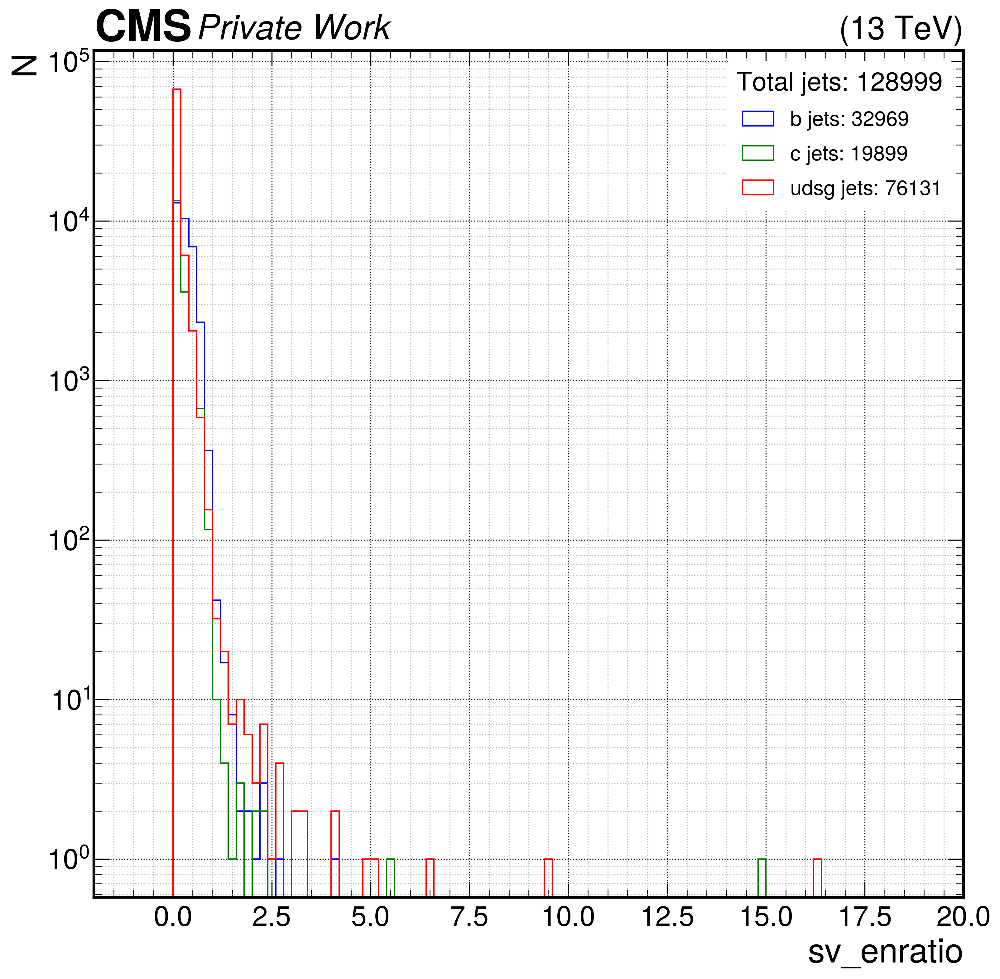

In [4]:
### Plot histograms of quantities
quantities = [
             #'jet_pt','jet_eta', 'nCpfcand','nNpfcand', 'nsv','npv', 'TagVarCSV_trackSumJetEtRatio', 'TagVarCSV_trackSumJetDeltaR', 'TagVarCSV_vertexCategory', 'TagVarCSV_trackSip2dValAboveCharm', 'TagVarCSV_trackSip2dSigAboveCharm', 'TagVarCSV_trackSip3dValAboveCharm', 'TagVarCSV_trackSip3dSigAboveCharm', 'TagVarCSV_jetNSelectedTracks', 'TagVarCSV_jetNTracksEtaRel',
             #'Cpfcan_BtagPf_trackEtaRel', 'Cpfcan_BtagPf_trackPtRel', 'Cpfcan_BtagPf_trackPPar', 'Cpfcan_BtagPf_trackDeltaR', 'Cpfcan_BtagPf_trackPParRatio', 'Cpfcan_BtagPf_trackSip2dVal', 'Cpfcan_BtagPf_trackSip2dSig', 'Cpfcan_BtagPf_trackSip3dVal', 'Cpfcan_BtagPf_trackSip3dSig', 'Cpfcan_BtagPf_trackJetDistVal', 'Cpfcan_ptrel', 'Cpfcan_drminsv', 'Cpfcan_VTX_ass', 'Cpfcan_puppiw', 'Cpfcan_chi2', 'Cpfcan_quality',
             #'Npfcan_ptrel', 'Npfcan_deltaR', 'Npfcan_isGamma', 'Npfcan_HadFrac', 'Npfcan_drminsv', 'Npfcan_puppiw',
             'sv_pt','sv_deltaR', 'sv_mass', 'sv_ntracks', 'sv_chi2', 'sv_normchi2', 'sv_dxy', 'sv_dxysig', 'sv_d3d', 'sv_d3dsig', 'sv_costhetasvpv', 'sv_enratio'
]
# normalize histograms for all flavours
normalize_by_flavour = False
# specify binning: [left edge, right edge, Nbins]
quantity_binnings = {
    # global
    'jet_pt': [0,500,100], 
    'jet_eta': [-3,3,60],
    'nCpfcand': [-0.5,50.5,51],
    'nNpfcand': [-0.5,50.5,51],
    'nsv': [-0.5,15.5,16],
    'npv': [-0.5,100.5,101],
    'TagVarCSV_trackSumJetEtRatio': [-1,24,100],
    'TagVarCSV_trackSumJetDeltaR': [-1,5,60],
    'TagVarCSV_vertexCategory': [-1.5,5.5,7],
    'TagVarCSV_trackSip2dValAboveCharm': [-2,2,100],
    'TagVarCSV_trackSip2dSigAboveCharm': [-100,100,100],
    'TagVarCSV_trackSip3dValAboveCharm': [-2,2,100],
    'TagVarCSV_trackSip3dSigAboveCharm': [-100,100,100],
    'TagVarCSV_jetNSelectedTracks': [-0.5,50.5,51],
    'TagVarCSV_jetNTracksEtaRel': [-0.5,50.5,51],
    # cpf
    'Cpfcan_BtagPf_trackEtaRel': [-5,15,100],
    'Cpfcan_BtagPf_trackPtRel': [-1,5,60],
    'Cpfcan_BtagPf_trackPPar': [-5,195,200],
    'Cpfcan_BtagPf_trackDeltaR': [-1,5,60],
    'Cpfcan_BtagPf_trackPParRatio': [-2,2,100],
    'Cpfcan_BtagPf_trackSip2dVal': [-1,24,100],
    'Cpfcan_BtagPf_trackSip2dSig': [-1,50,102],
    'Cpfcan_BtagPf_trackSip3dVal': [-1,24,100],
    'Cpfcan_BtagPf_trackSip3dSig': [-1,50,102],
    'Cpfcan_BtagPf_trackJetDistVal': [-23,2,100],
    'Cpfcan_ptrel': [-1,1,100],
    'Cpfcan_drminsv': [-1,1,100],
    'Cpfcan_VTX_ass': [-0.5,10.5,11],
    'Cpfcan_puppiw': [-0.5,5.5,6],
    'Cpfcan_chi2': [0,250,250],
    'Cpfcan_quality': [-0.5,10.5,11],
    # npf
    'Npfcan_ptrel': [-1,0,100], 
    'Npfcan_deltaR': [-1,0,100],
    'Npfcan_isGamma': [-1,1,100], 
    'Npfcan_HadFrac': [-1,1,100], 
    'Npfcan_drminsv': [-1,0,100], 
    'Npfcan_puppiw': [-1,1,100],
    # vtx
    'sv_pt': [-10,1500,151],
    'sv_deltaR': [-1,0.1,110],
    'sv_mass': [-1,100,101],
    'sv_ntracks': [-0.5,20.5,21],
    'sv_chi2': [-1,50,51],
    'sv_normchi2': [-1000,1000,100],
    'sv_dxy': [-1,50,102],
    'sv_dxysig': [-10,1000,101],
    'sv_d3d': [-1,120,121],
    'sv_d3dsig': [-10,1000,101],
    'sv_costhetasvpv': [-1.1,1.1,110],
    'sv_enratio': [-2,20,110],
}

for quantity in quantities:
    quantity_array = get_array(quantity)
    binning = quantity_binnings[quantity]
    print('{}: minimum {:n} , maximum {:n}'.format(quantity,np.min(quantity_array),np.max(quantity_array)))
    print('    -999: {:n} , -1: {:n} , 0:{:n}'.format(len(np.where(quantity_array==-999)[0]),len(np.where(quantity_array==-1)[0]),len(np.where(quantity_array==0)[0])))
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=binning[0], right=binning[1])
    ax.set_yscale('log')
    ax.set_ylabel('N')
    ax.set_xlabel(quantity_labels[quantity])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    if normalize_by_flavour:
        ax.hist(quantity_array[B==1], density=True, bins=binning[2], range=(binning[0],binning[1]), label='b jets: {:n}'.format(np.sum(B)), color='blue', histtype='step')
        ax.hist(quantity_array[C==1], density=True, bins=binning[2], range=(binning[0],binning[1]), label='c jets: {:n}'.format(np.sum(C)), color='green', histtype='step')
        ax.hist(quantity_array[L==1], density=True, bins=binning[2], range=(binning[0],binning[1]), label='udsg jets: {:n}'.format(np.sum(L)), color='red', histtype='step') 
    else:
        ax.hist(quantity_array[B==1], bins=binning[2], range=(binning[0],binning[1]), label='b jets: {:n}'.format(np.sum(B)), color='blue', histtype='step')
        ax.hist(quantity_array[C==1], bins=binning[2], range=(binning[0],binning[1]), label='c jets: {:n}'.format(np.sum(C)), color='green', histtype='step')
        ax.hist(quantity_array[L==1], bins=binning[2], range=(binning[0],binning[1]), label='udsg jets: {:n}'.format(np.sum(L)), color='red', histtype='step')
    legloc = 'upper right'
    leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/{}.pdf'.format(saveDir,quantity))

<ipython-input-3-e9092efd5c9e>:3: RuntimeWarning: invalid value encountered in true_divide
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-3-e9092efd5c9e>:3: RuntimeWarning: invalid value encountered in true_divide
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-3-e9092efd5c9e>:3: RuntimeWarning: divide by zero encountered in log
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])
<ipython-input-3-e9092efd5c9e>:3: RuntimeWarning: invalid value encountered in multiply
  return np.sum([v for v in A * np.log(A/B) if not np.isnan(v)])


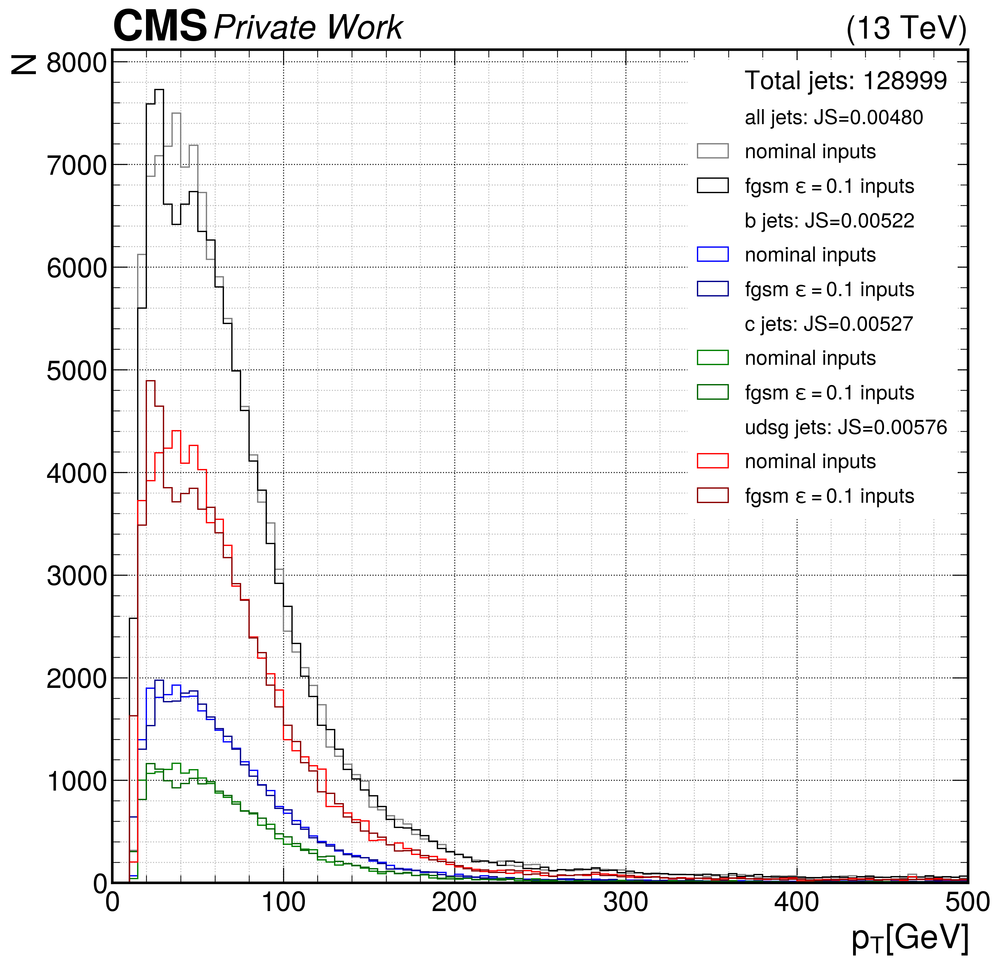

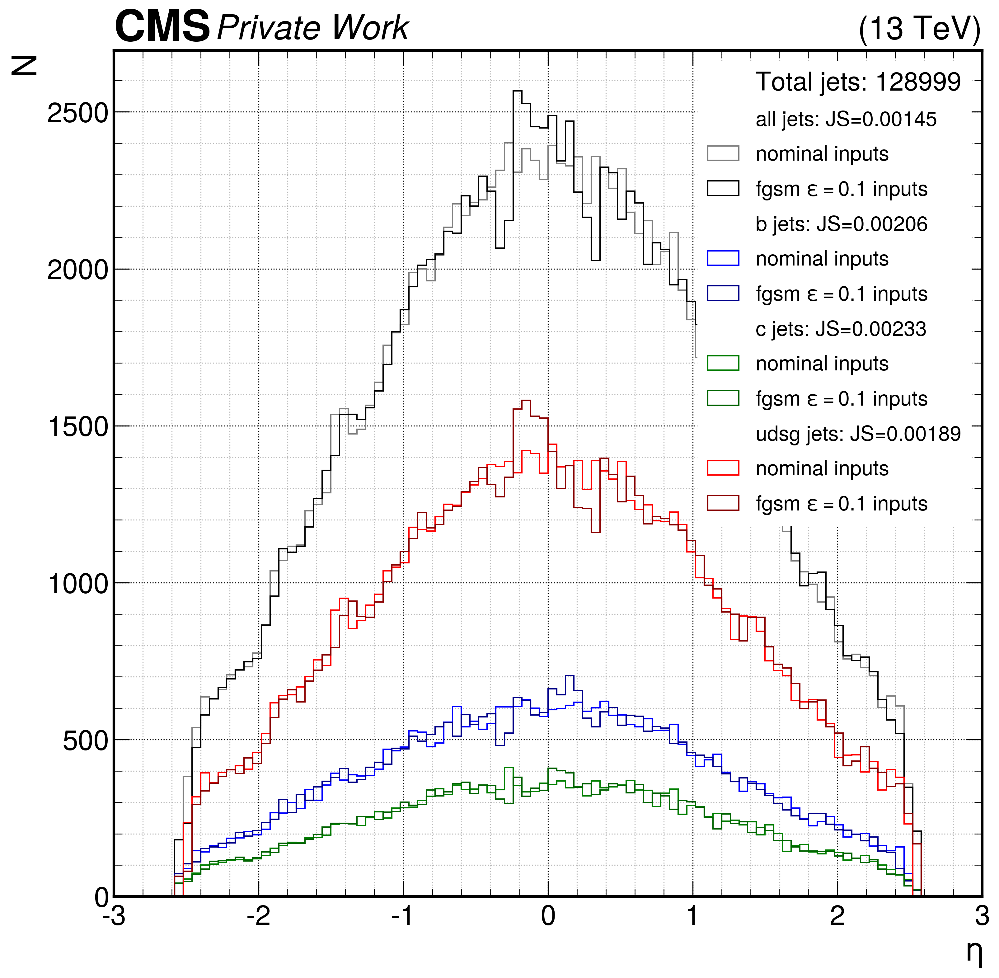

In [14]:
### Plot nominal and adversarial inputs
# list of quantities to plot
quantities = ['jet_pt','jet_eta']
# specify attack
attack = 'fgsm-0_1'
# specify binning: [left edge, right edge, Nbins]
quantity_binnings = {
    'jet_pt': [0,500,100],
    'jet_eta': [-3,3,100]
}
# specify selections
selections = ['all','b','c','udsg']
selection_indices = {
    'all':B+C+L==1,
    'b':B==1,
    'c':C==1,
    'udsg':L==1,
}
selection_colors = {
    'all': ['grey','black'],
    'b': ['blue','darkblue'],
    'c': ['green','darkgreen'],
    'udsg': ['red','darkred'],
}

for quantity in quantities:
    quantity_array1 = get_array(quantity, attack='nominal')
    quantity_array2 = get_array(quantity, attack=attack)
    binning = quantity_binnings[quantity]
    # compute the JS divergence values
    js_values = np.zeros(len(selections))
    for i,selection in enumerate(selections):
        counts = np.histogram(quantity_array1[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]))[0]
        adv_counts = np.histogram(quantity_array2[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]))[0]
        js_values[i] = jsdiv(counts, adv_counts, normalize_first=True)
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_xlim(left=binning[0], right=binning[1])
    ax.set_ylabel('N')
    ax.set_xlabel(quantity_labels[quantity])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    for i,selection in enumerate(selections):
        ax.hist([], linewidth=0, histtype='step', label='{} jets: JS={:.5f}'.format(selection,js_values[i]))
        ax.hist(quantity_array1[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]), label='nominal inputs', color=selection_colors[selection][0], histtype='step')
        ax.hist(quantity_array2[selection_indices[selection]], bins=binning[2], range=(binning[0],binning[1]), label='{} inputs'.format(attack_labels[attack]), color=selection_colors[selection][1], histtype='step')
    legloc = 'upper right'
    leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/attack_hist-{}.pdf'.format(saveDir,quantity))

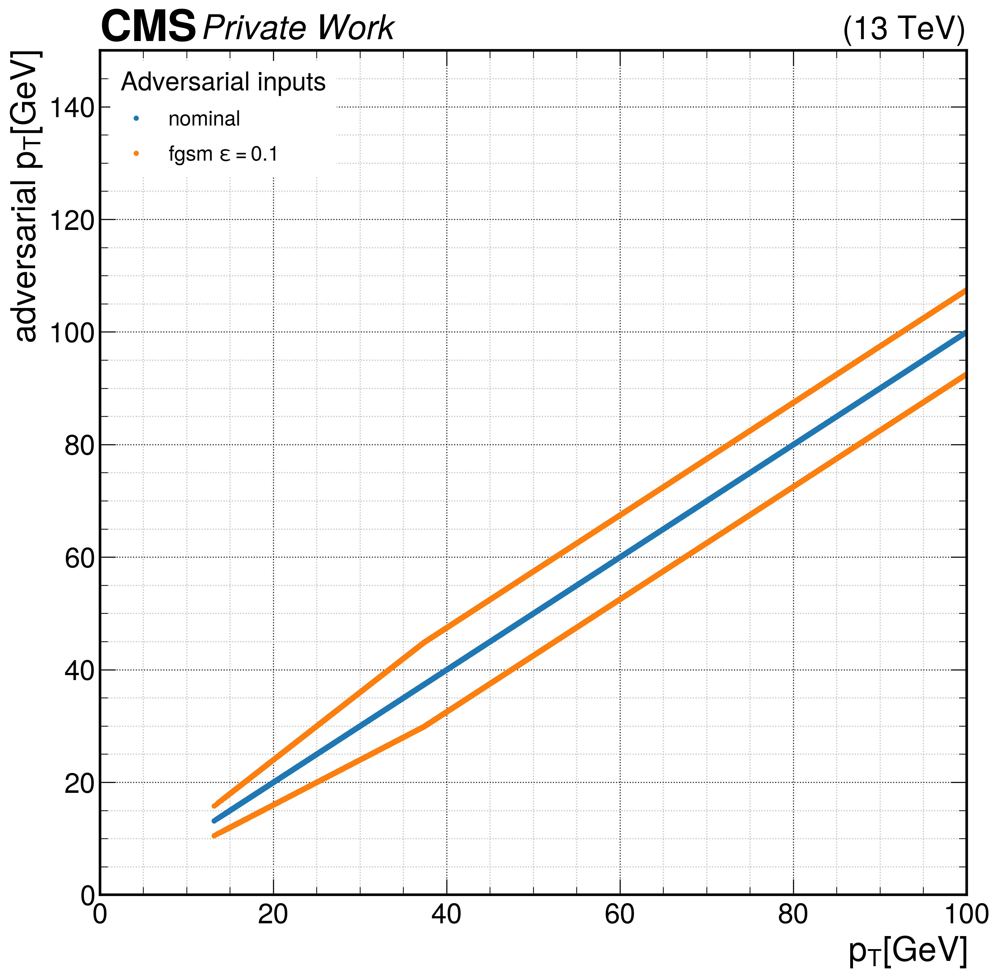

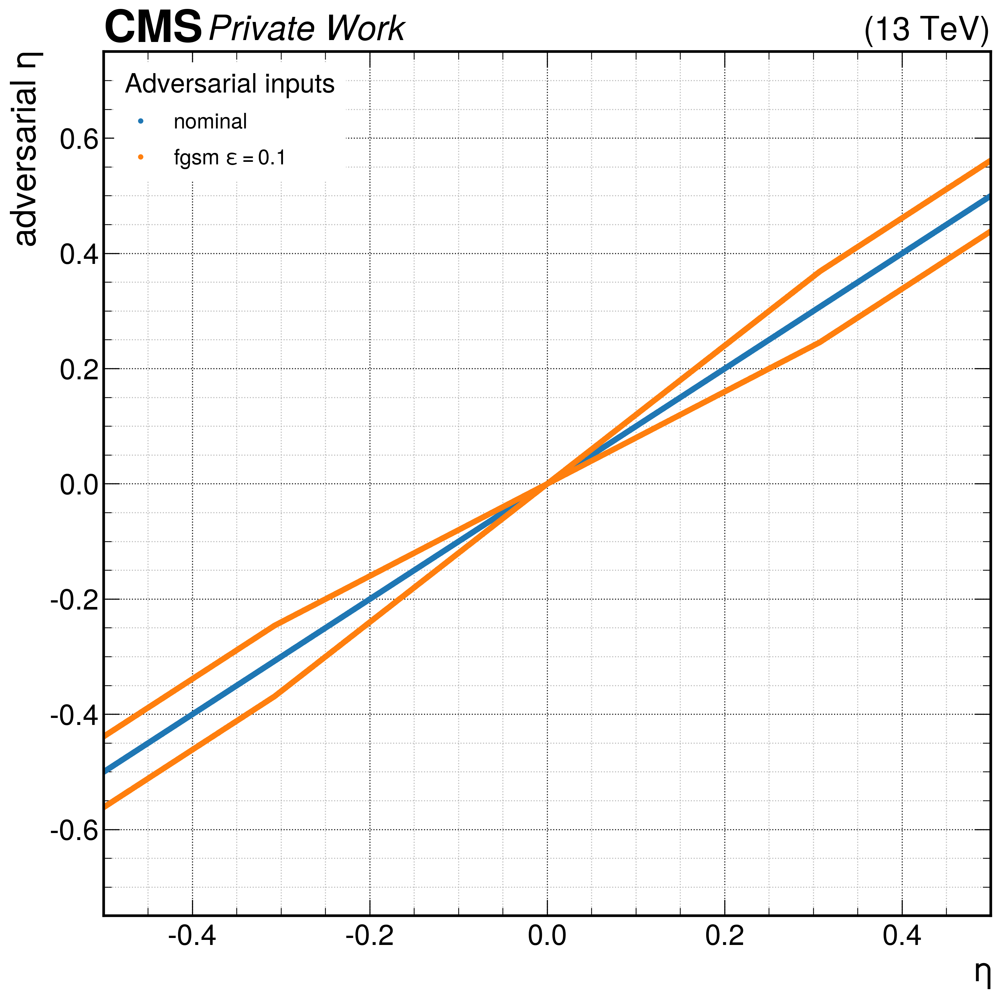

In [16]:
### Plot adversarial inputs against nominal inputs
# list of quantities and attacks to plot
quantities = ['jet_pt','jet_eta']
attacks = ['nominal', 'fgsm-0_1']
# set ploting ranges
quantity_ranges = {
    'jet_pt': [0,100],
    'jet_eta': [-0.5,0.5]
}
# set colors
attack_colors = {
    'nominal': 'tab:blue',
    'fgsm-0_1': 'tab:orange'
}

for quantity in quantities:
    quantity_array = get_array(quantity)
    ranges = quantity_ranges[quantity]
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    ax.set_ylim(bottom=ranges[0]-0.5*abs(ranges[0]), top=ranges[1]+0.5*abs(ranges[1]))
    ax.set_xlim(left=ranges[0], right=ranges[1])
    ax.set_ylabel('adversarial '+quantity_labels[quantity])
    ax.set_xlabel(quantity_labels[quantity])
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    for attack in attacks:
        adv_quantity_array = get_array(quantity, attack=attack)
        label = attack_labels[attack]
        color = attack_colors[attack]
        ax.plot(quantity_array, adv_quantity_array, label=label, color=color, linestyle='None', marker='.') 
    legloc = 'upper left'
    leg=ax.legend(title='Adversarial inputs', fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/attack-{}.pdf'.format(saveDir,quantity))


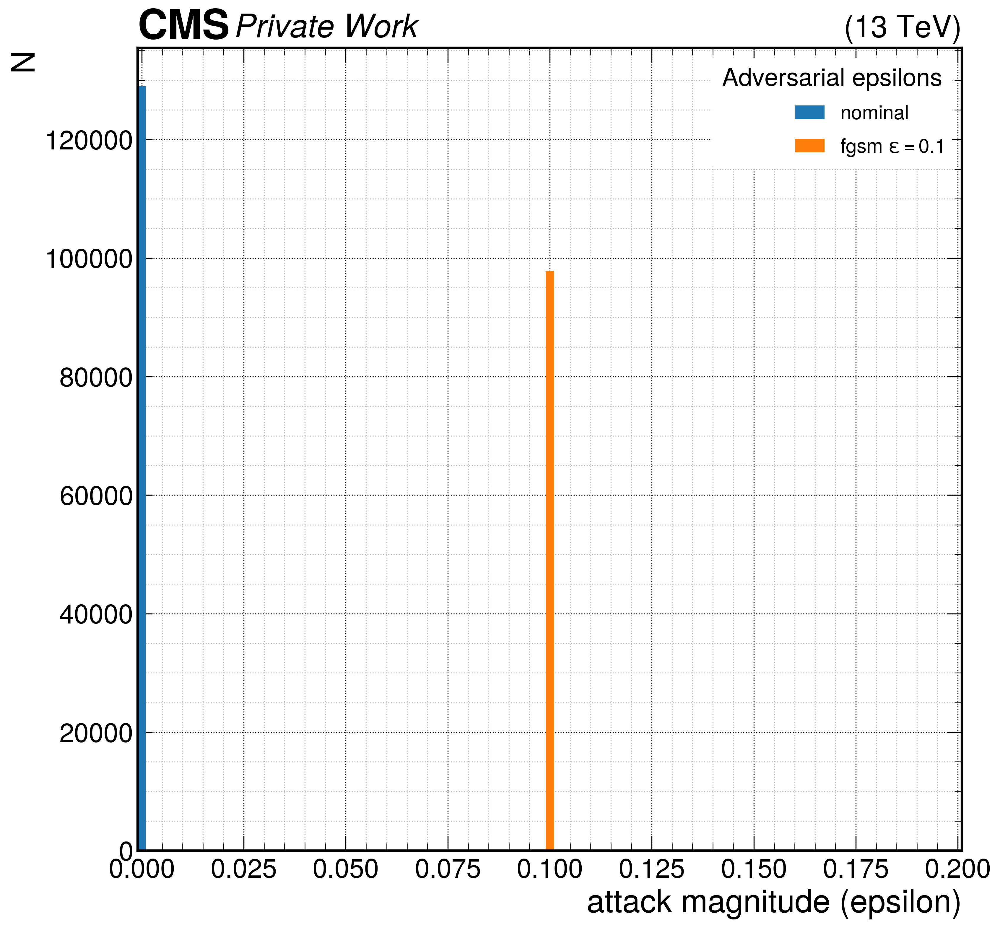

In [19]:
### Plot attack magnitudes (global epsilons) of the adversarial inputs
quantity = 'jet_pt'
quantity_epsilon = np.load('/home/home1/institut_3a/hschoenen/repositories/DeepJet/epsilons/global_standardized_epsilons.npy')[0]
restrict_impact = 0.2
# list of attacks
attacks = ['nominal', 'fgsm-0_1']
# choose binning: [left edge, right edge, Nbins] and center it
binning = [0,0.2,100]
binwidth = (binning[1]-binning[0])/binning[2]
left_edge = binning[0] - 0.5*binwidth
right_edge = binning[1] + 0.5*binwidth
Nbins = binning[2]+1
# set colors
attack_colors = {
    'nominal': 'tab:blue',
    'fgsm-0_1': 'tab:orange'
}

# make figure
fig,ax = plt.subplots(figsize=[12,12], dpi=300)
ax.set_xlim(left = left_edge, right = right_edge)
ax.set_ylabel('N')
ax.set_xlabel('attack magnitude (epsilon)')
ax.grid(which='minor', alpha=0.85)
ax.grid(which='major', alpha=0.95, color='black')
for attack in attacks:
    quantity_array = get_array(quantity)
    adv_quantity_array = get_array(quantity, attack=attack)
    label = attack_labels[attack]
    color = attack_colors[attack]
    # calculate epsilons (reverse engineering)
    delta = np.abs(adv_quantity_array-quantity_array)
    no_restrict_impact = np.where(np.abs(delta/quantity_array-restrict_impact)>0.00001)[0]
    epsilons = delta[no_restrict_impact]/quantity_epsilon
    # plot histogram
    ax.hist(epsilons, range=(left_edge,right_edge), bins=Nbins, label=label, color=color)
legloc = 'upper right'
leg=ax.legend(title='Adversarial epsilons', fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
if 'right' in legloc:
    aligned = 'right'
else:
    aligned = 'left'
leg._legend_box.align = aligned
leg.get_frame().set_linewidth(0.0)
hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
fig.savefig('{}/inputs/attack-epsilons.pdf'.format(saveDir))

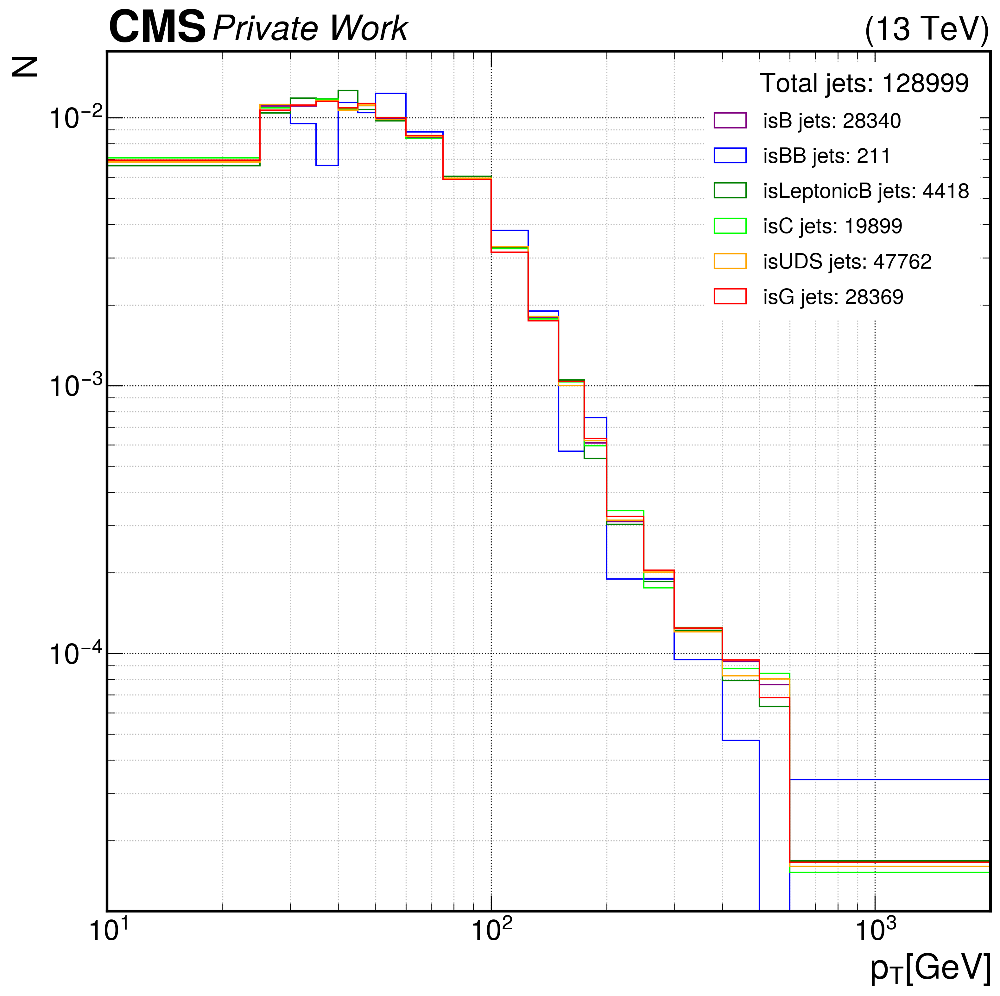

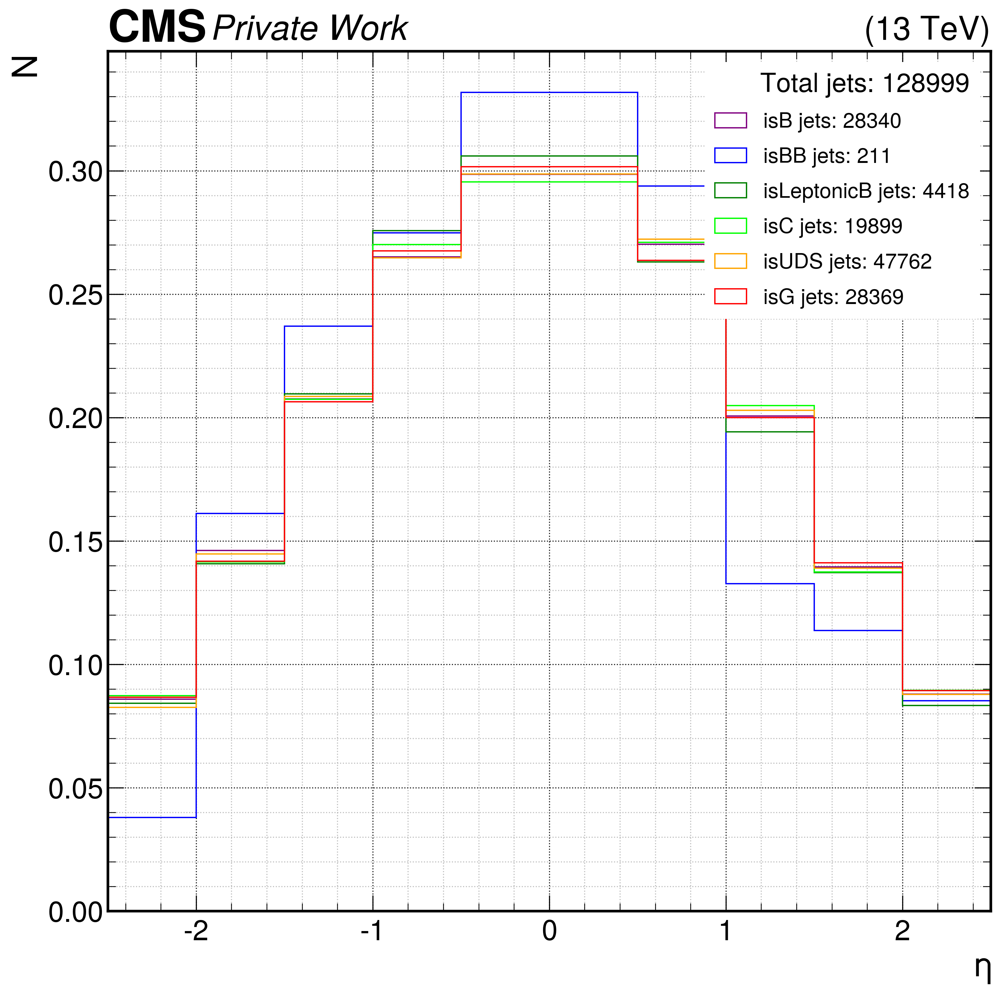

In [20]:
### Plot histograms of pt and eta for all six categories (weighting bins)
quantities = ['jet_pt', 'jet_eta']
# normalize histograms for all flavours
normalize_by_flavour = True
# specify binning: [left edge, right edge, Nbins]
quantity_binnings = {
    'jet_pt': [10,25,30,35,40,45,50,60,75,100,125,150,175,200,250,300,400,500,600,2000], 
    'jet_eta': [-2.5,-2.,-1.5,-1.,-0.5,0.5,1,1.5,2.,2.5],
}

for quantity in quantities:
    quantity_array = get_array(quantity)
    binning = quantity_binnings[quantity]
    # make figure
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=binning[0], right=binning[-1])
    ax.set_ylabel('N')
    ax.set_xlabel(quantity_labels[quantity])
    if quantity=='jet_pt':
        ax.set_yscale('log')
        ax.set_xscale('log')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    if normalize_by_flavour:
        ax.hist(quantity_array[isB==1], density=True, bins=binning, label='isB jets: {:n}'.format(np.sum(isB)), color='purple', histtype='step')
        ax.hist(quantity_array[isBB==1], density=True, bins=binning, label='isBB jets: {:n}'.format(np.sum(isBB)), color='blue', histtype='step')
        ax.hist(quantity_array[isLeptonicB==1], density=True, bins=binning, label='isLeptonicB jets: {:n}'.format(np.sum(isLeptonicB)), color='green', histtype='step')
        ax.hist(quantity_array[isC==1], density=True, bins=binning, label='isC jets: {:n}'.format(np.sum(isC)), color='lime', histtype='step')
        ax.hist(quantity_array[isUDS==1], density=True, bins=binning, label='isUDS jets: {:n}'.format(np.sum(isUDS)), color='orange', histtype='step')
        ax.hist(quantity_array[isG==1], density=True, bins=binning, label='isG jets: {:n}'.format(np.sum(isG)), color='red', histtype='step')
    else:
        ax.hist(quantity_array[isB==1], bins=binning, label='isB jets: {:n}'.format(np.sum(isB)), color='purple', histtype='step')
        ax.hist(quantity_array[isBB==1], bins=binning, label='isBB jets: {:n}'.format(np.sum(isBB)), color='blue', histtype='step')
        ax.hist(quantity_array[isLeptonicB==1], bins=binning, label='isLeptonicB jets: {:n}'.format(np.sum(isLeptonicB)), color='green', histtype='step')
        ax.hist(quantity_array[isC==1], bins=binning, label='isC jets: {:n}'.format(np.sum(isC)), color='lime', histtype='step')
        ax.hist(quantity_array[isUDS==1], bins=binning, label='isUDS jets: {:n}'.format(np.sum(isUDS)), color='orange', histtype='step')
        ax.hist(quantity_array[isG==1], bins=binning, label='isG jets: {:n}'.format(np.sum(isG)), color='red', histtype='step')
    legloc = 'upper right'
    leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    if 'right' in legloc:
        aligned = 'right'
    else:
        aligned = 'left'
    leg._legend_box.align = aligned
    leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/{}-weights.pdf'.format(saveDir,quantity))

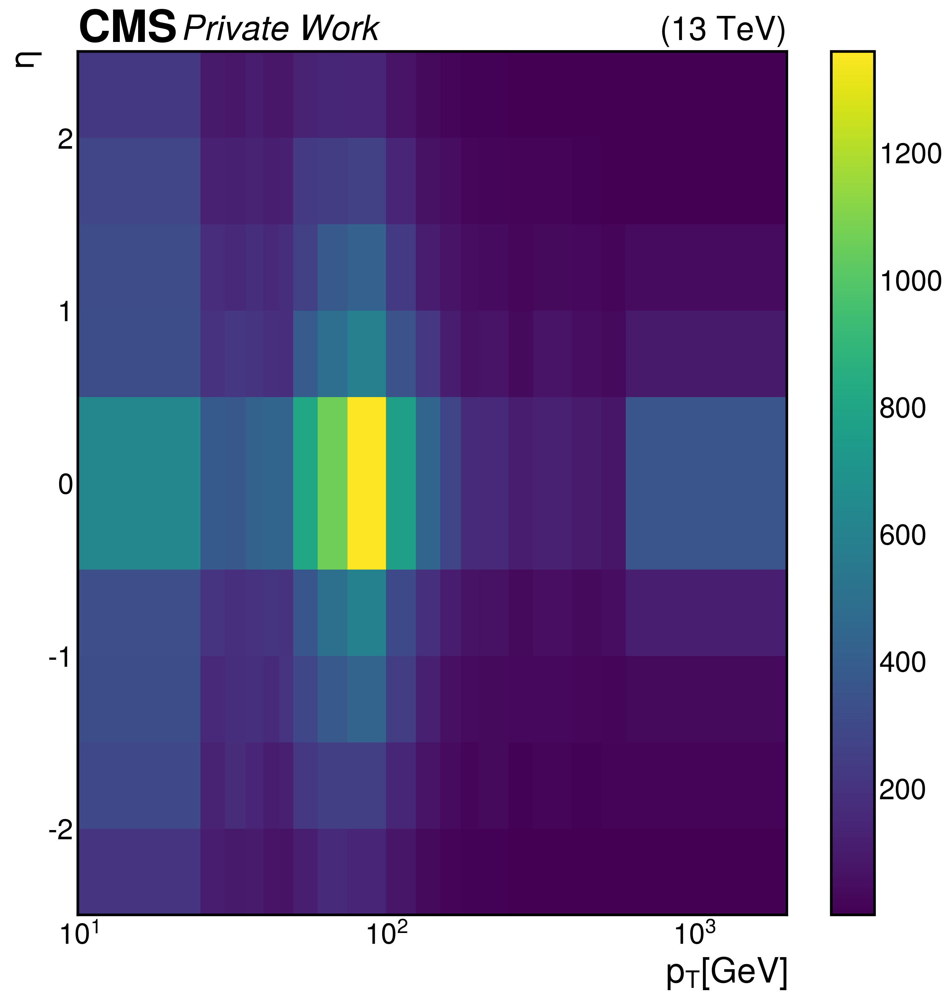

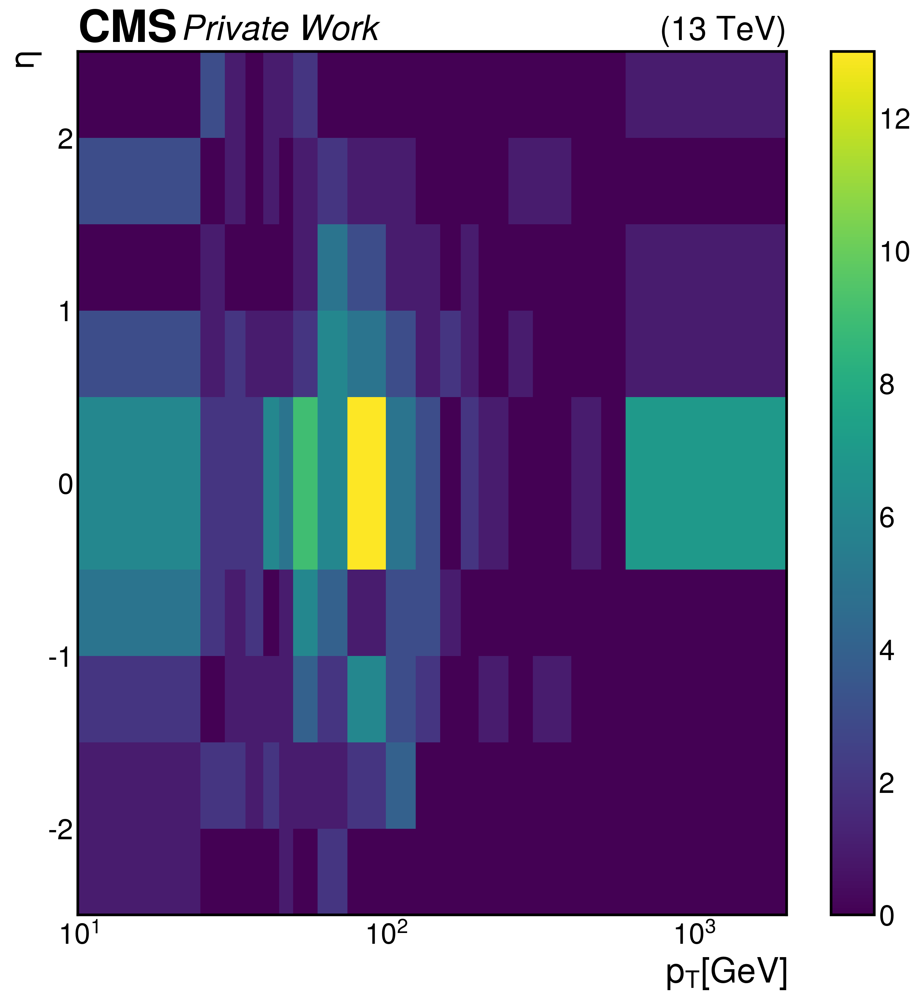

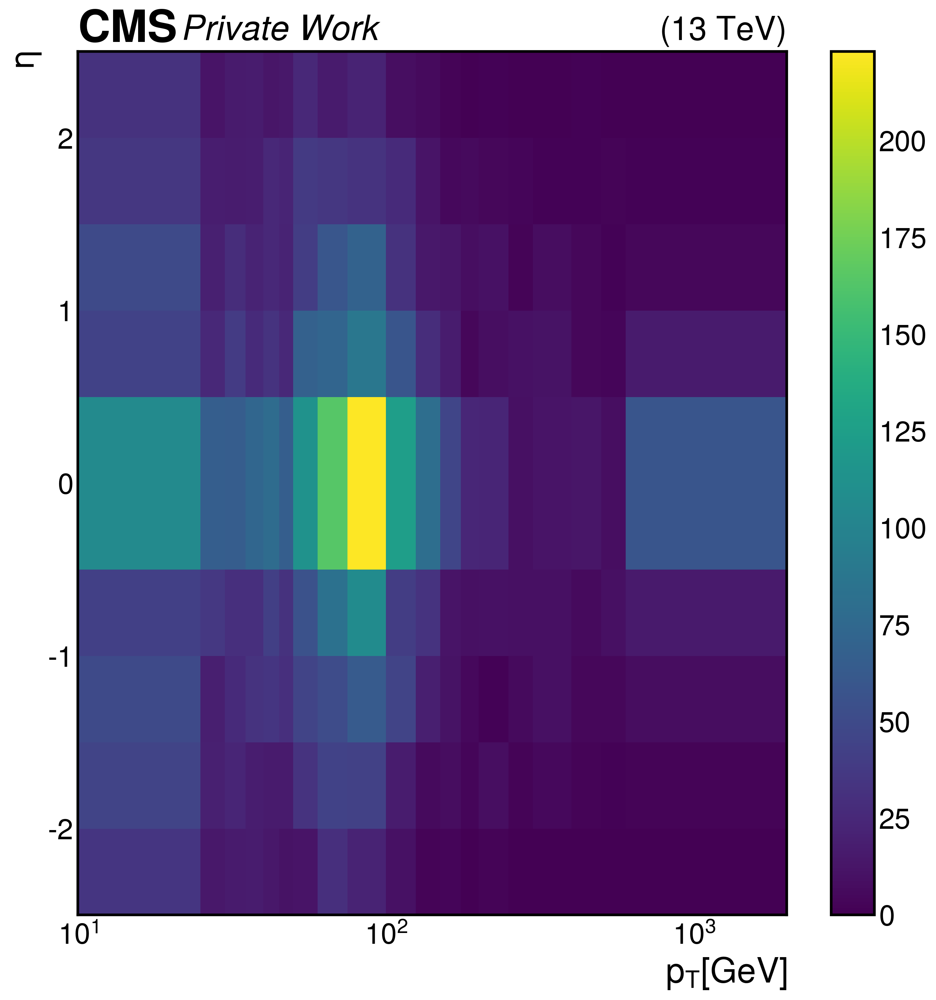

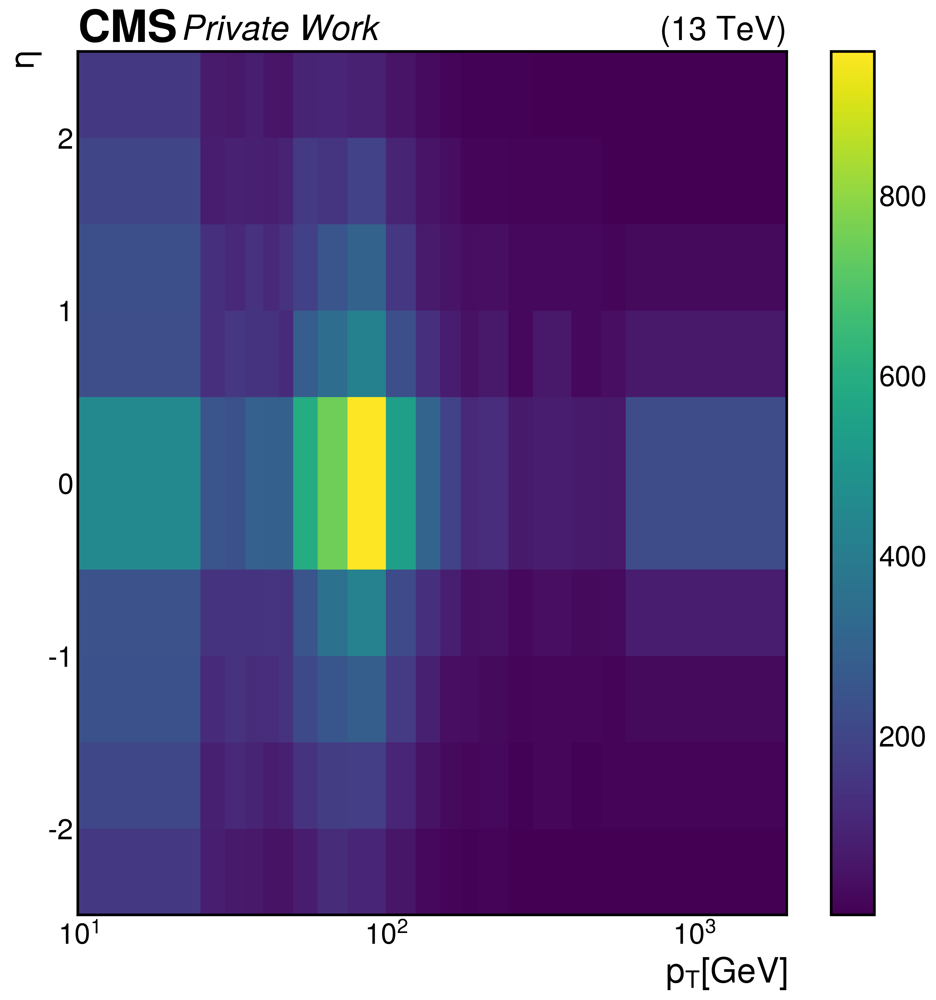

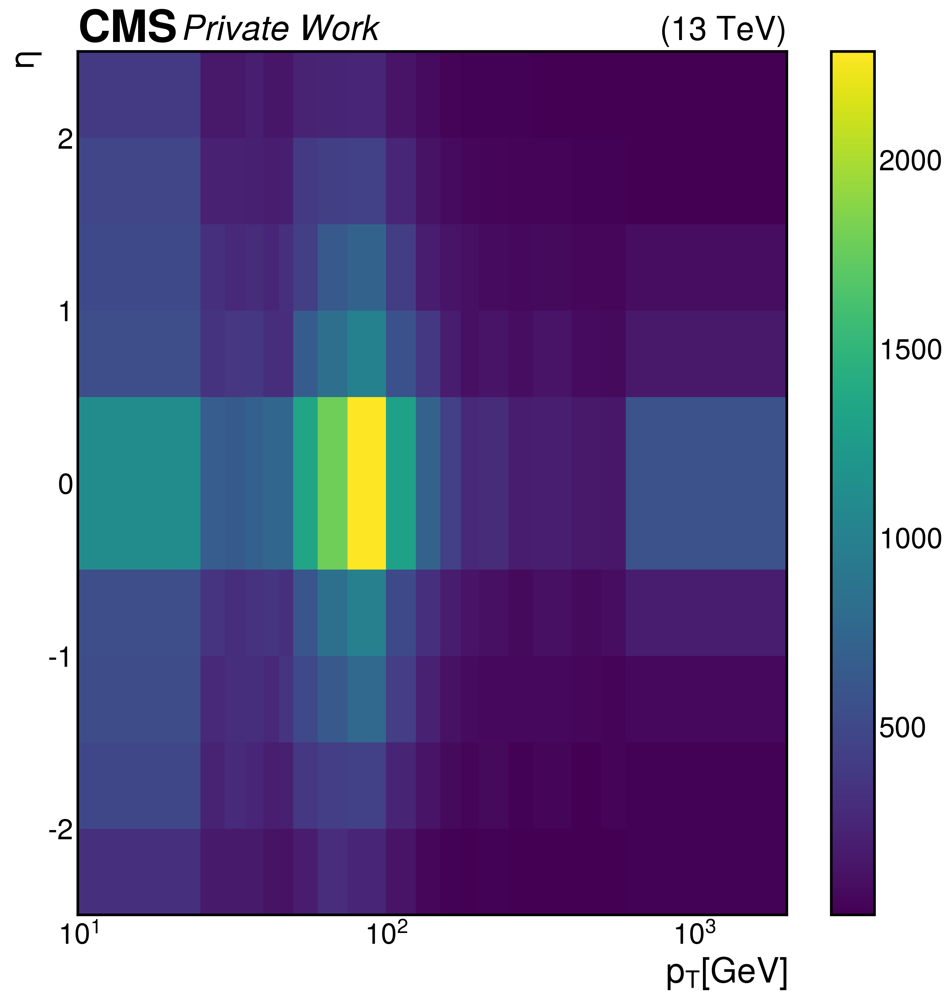

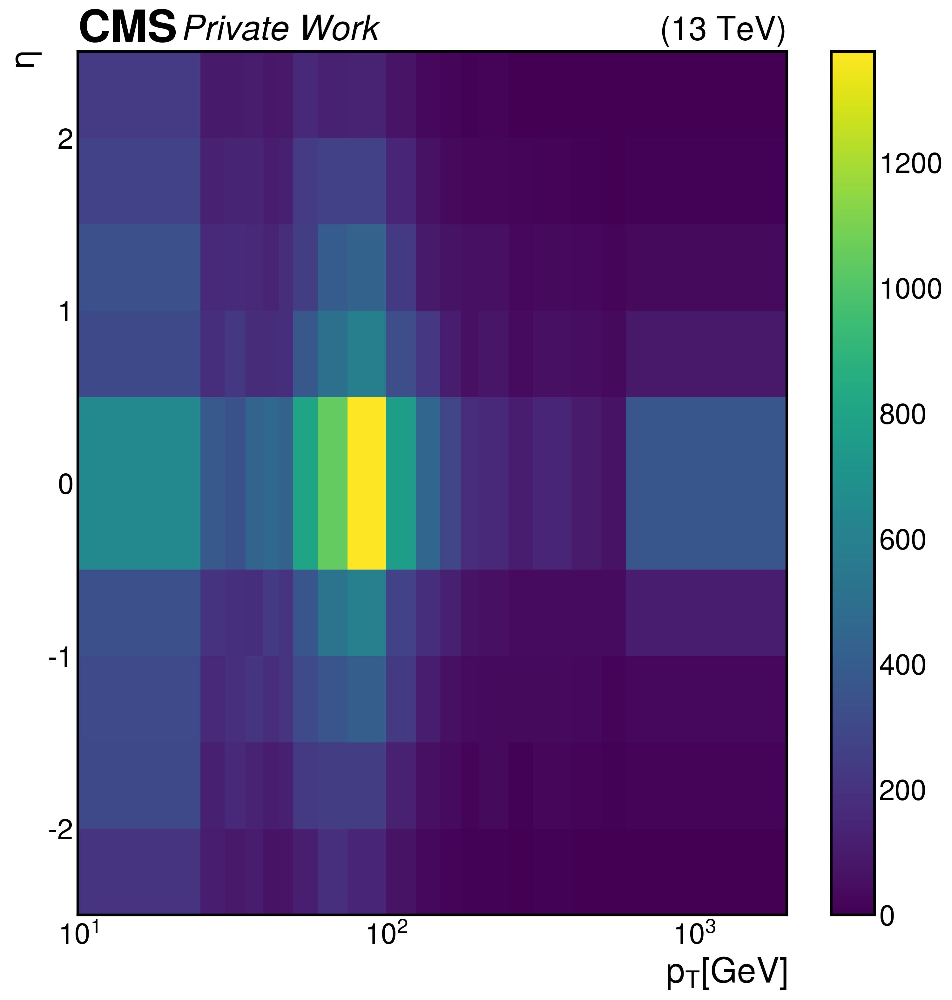

In [21]:
# print 2D histogram (pt,eta) for all 6 categories (weighting bins)
flavours = [isB,isBB,isLeptonicB,isC,isUDS,isG]
flavour_names = ['isB','isBB','isLeptonicB','isC','isUDS','isG']
quantity_binnings = {
    'jet_pt': [10,25,30,35,40,45,50,60,75,100,125,150,175,200,250,300,400,500,600,2000], 
    'jet_eta': [-2.5,-2.,-1.5,-1.,-0.5,0.5,1,1.5,2.,2.5],
}

for i,flavour in enumerate(flavours):
    x = 'jet_pt'
    y = 'jet_eta'
    x_array = get_array(x)
    y_array = get_array(y)
    x_binning = quantity_binnings[x]
    y_binning = quantity_binnings[y]
    x_label = quantity_labels[x]
    y_label = quantity_labels[y]
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=x_binning[0], right=x_binning[-1])
    ax.set_ylim(bottom=y_binning[0], top=y_binning[-1])
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_xscale('log')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    h = ax.hist2d(x_array[flavour==1], y_array[flavour==1], bins=[x_binning, y_binning])
    fig.colorbar(h[3], ax=ax)
    #legloc = 'upper right'
    #leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    #if 'right' in legloc:
        #aligned = 'right'
    #else:
        #aligned = 'left'
    #leg._legend_box.align = aligned
    #leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/weights-{}.pdf'.format(saveDir,flavour))

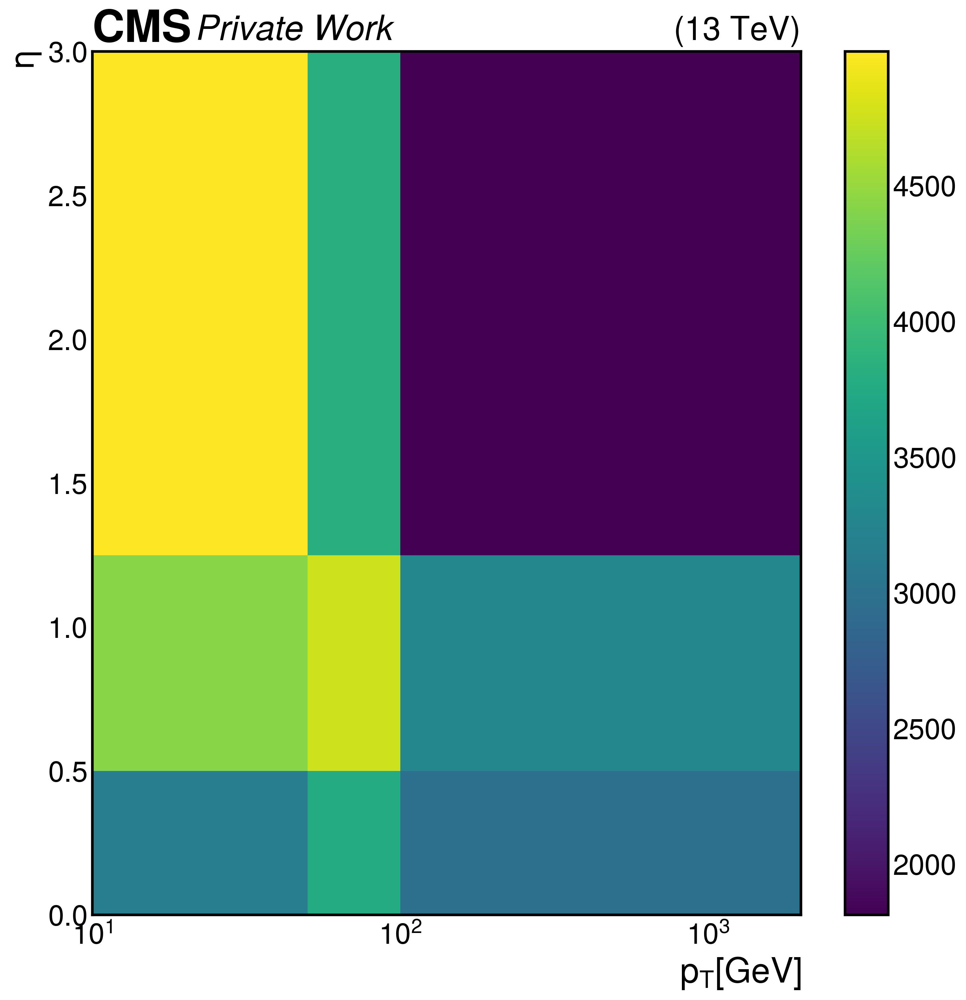

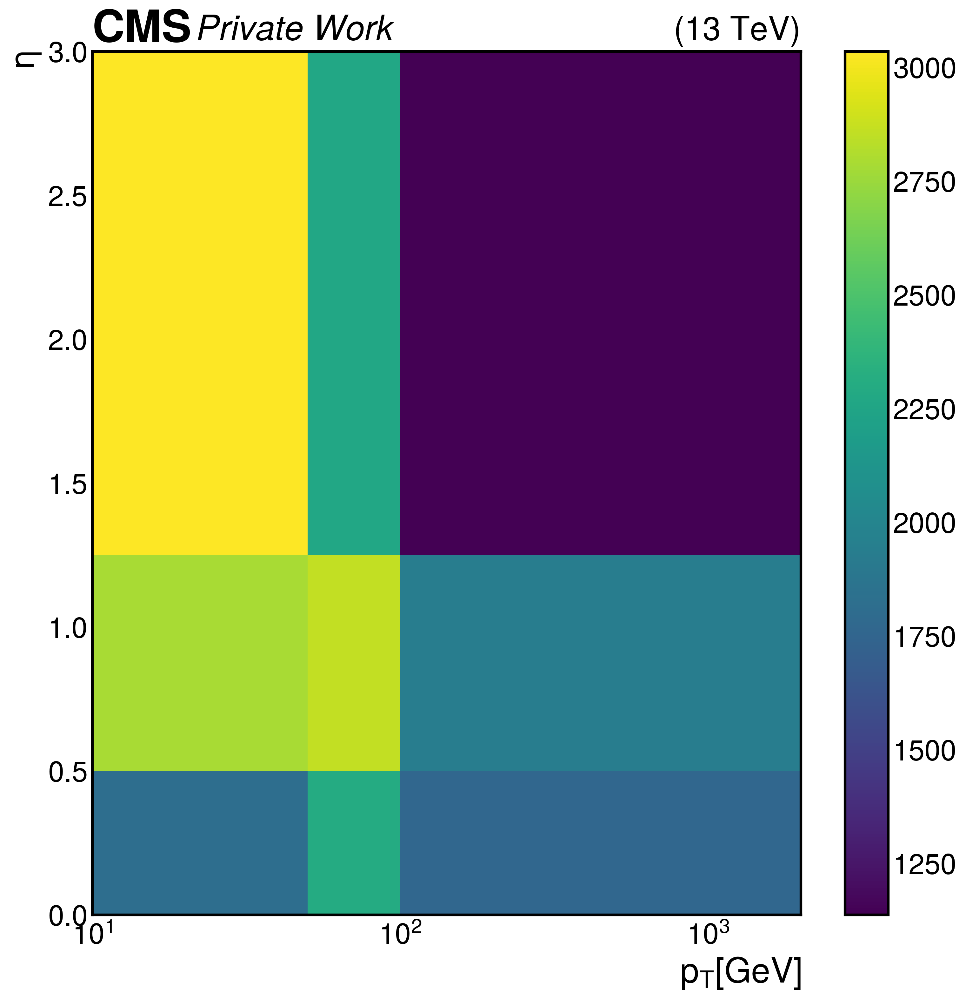

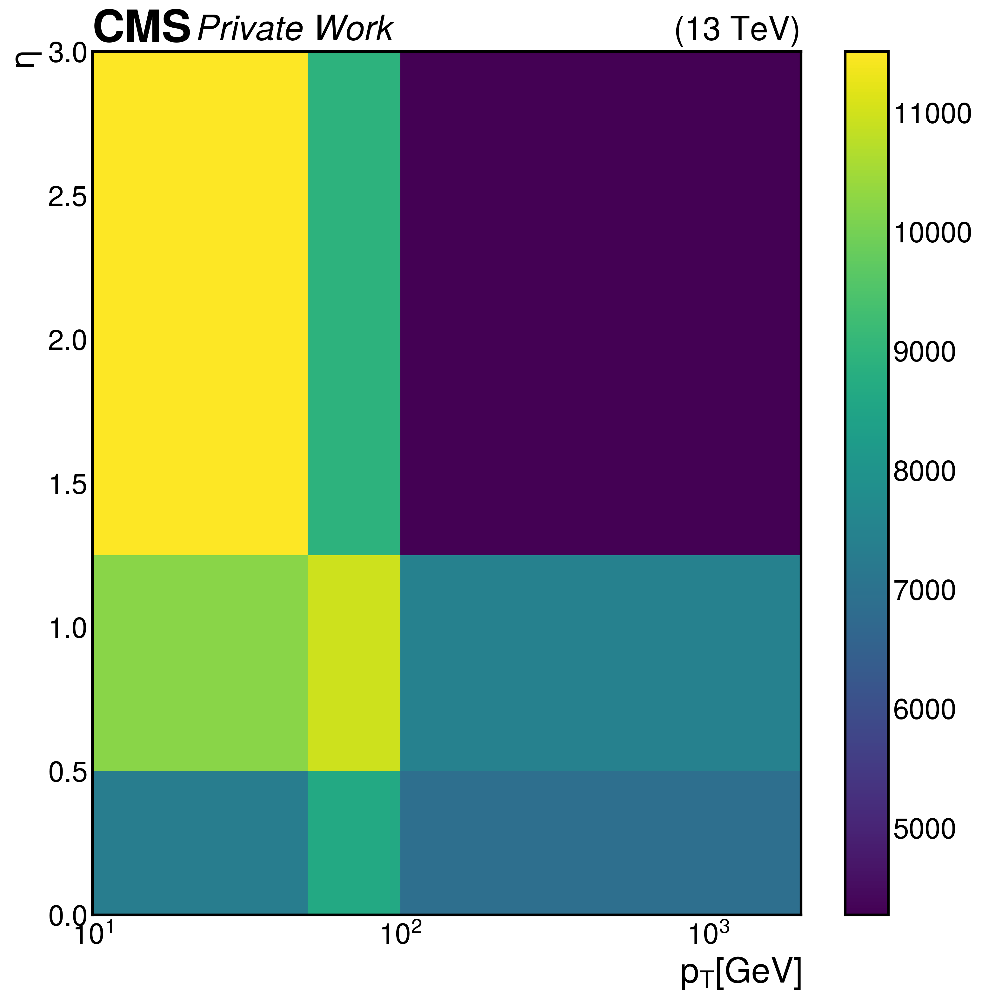

In [27]:
# print 2D histogram (pt,eta) for all 6 categories (weighting bins)
flavours = [isB+isBB+isLeptonicB,isC,isUDS+isG]
flavour_names = ['b','c','udsg']
quantity_binnings = {
    'jet_pt': [10,50,100,2000], 
    'jet_eta': [0,0.5,1.25,3],
}

for i,flavour in enumerate(flavours):
    x = 'jet_pt'
    y = 'jet_eta'
    x_array = get_array(x)
    y_array = np.abs(get_array(y))
    x_binning = quantity_binnings[x]
    y_binning = quantity_binnings[y]
    x_label = quantity_labels[x]
    y_label = quantity_labels[y]
    fig,ax = plt.subplots(figsize=[12,12], dpi=300)
    plt.style.use(hep.cms.style.ROOT)
    ax.set_xlim(left=x_binning[0], right=x_binning[-1])
    ax.set_ylim(bottom=y_binning[0], top=y_binning[-1])
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_xscale('log')
    ax.grid(which='minor', alpha=0.85)
    ax.grid(which='major', alpha=0.95, color='black')
    # plot histograms
    h = ax.hist2d(x_array[flavour==1], y_array[flavour==1], bins=[x_binning, y_binning])
    fig.colorbar(h[3], ax=ax)
    #legloc = 'upper right'
    #leg=ax.legend(title='Total jets: {}'.format(len(isB)), fontsize=16, title_fontsize=20, labelspacing=0.7, loc=legloc, frameon=True, framealpha=1, facecolor='white')
    #if 'right' in legloc:
        #aligned = 'right'
    #else:
        #aligned = 'left'
    #leg._legend_box.align = aligned
    #leg.get_frame().set_linewidth(0.0)
    hep.cms.label(llabel='Private Work', rlabel='(13 TeV)')
    fig.savefig('{}/inputs/regions-{}.pdf'.format(saveDir,flavour))

In [10]:
js_values

array([0., 0., 0., 0.])